# Explore historical and future monthly LPJ-GUESS FPC

Exploration of the datasets to identify the max FPC.

In [1]:
from pathlib import Path
import warnings

import matplotlib.path as mpath
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize, TwoSlopeNorm
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
import xarray as xr

warnings.filterwarnings("ignore")
plt.rcParams.update({
    "font.family": "STIXGeneral",
    "mathtext.fontset": "stix",
    "font.size": 11,
    "axes.titlesize": 12,
})

import cartopy.crs as ccrs
import cartopy.feature as cfeature


## 1 · Configuration
Figures
are saved as both PNG and PDF. Set `PFTS_TO_MAP` to a shorter list if you do
not want six-panel maps for every natural PFT.


In [2]:
DATA_DIR = Path("/nird/datapeak/NS9188K/adelez/BRL-FRST-XPSN/data/edit-surfdata/LPJ-GUESS")
FIGURE_DIR = Path("02-04-monthly-lpjguess-fpc-exploration-figures/LPJGUESS-PFTs")
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

FPC_FILES = {
    "Historical (1971–2000)": DATA_DIR / "mfpc_pft_avg_1971_2000_monthly_mean.out",
    "Future (2070–2100)": DATA_DIR / "mfpc_pft_avg_2070_2100_monthly_mean.out",
}

LPJ_NATURAL = [
    "BNE", "BINE", "BNS", "TeNE", "TeBE", "IBS", "TeBS", "C3G",
    "HSE", "HSS", "LSE", "LSS", "GRT", "EPDS", "SPDS", "CLM",
]

PFT_TO_CLM_GROUP = {
    "BNE": "BoNET", "BINE": "BoNET",
    "BNS": "BoNDT (larch)",
    "IBS": "BoBDT",
    "HSE": "BoBDS shrubs", "HSS": "BoBDS shrubs",
    "LSE": "BoBDS shrubs", "LSS": "BoBDS shrubs",
    "EPDS": "BoBDS shrubs", "SPDS": "BoBDS shrubs",
    "C3G": "aC3", "GRT": "aC3",
    "TeNE": "temperate trees", "TeBE": "temperate trees", "TeBS": "temperate trees", "CLM": "Unmapped",
}

GROUP_COLORS = {
    "BoNET": "#145A32",
    "BoNDT (larch)": "#E67E22",
    "BoBDT": "#6B8E23",
    "BoBDS shrubs": "#D4A017",
    "aC3": "#8B5A2B",
    "temperate trees": "teal",
    "Unmapped": "#7F7F7F",
}

PFT_LINESTYLES = ["-", "--", "-.", ":"]
PFT_MARKERS = ["o", "s", "^", "D", "v", "P"]
PFTS_TO_MAP = LPJ_NATURAL.copy()
PRESENCE_THRESHOLD = 1e-6
PEAK_AMPLITUDE_TOLERANCE = 1e-8
SCALE_PERCENTILE = 99.5
MAP_EXTENT = [-180, 180, 45, 90]


def save_figure(fig, filename):
    fig.savefig(FIGURE_DIR / f"{filename}.png", dpi=300, bbox_inches="tight")
    fig.savefig(FIGURE_DIR / f"{filename}.pdf", bbox_inches="tight")


def slug(text):
    return "".join(character.lower() if character.isalnum() else "_" for character in text).strip("_")

## 2 · Robust FPC loader and structural checks

Repeated header rows are removed before numeric conversion. Each file must
contain exactly one record for every `(Lon, Lat, Month)` key and every grid cell
must contain months 1–12. `Total` is checked against all PFT columns but is not
used in the analysis because it is not necessarily defined as their simple sum.

In [3]:
def load_monthly_field(path):
    if not path.exists():
        raise FileNotFoundError(path)

    frame = pd.read_csv(path, sep=r"\s+", low_memory=False)
    if "Lon" not in frame.columns:
        raise ValueError(f"{path}: no Lon column; inspect the header")

    repeated_headers = frame["Lon"].astype(str).eq("Lon")
    frame = frame.loc[~repeated_headers].copy()

    required = {"Lon", "Lat", "Month", "Total", *LPJ_NATURAL}
    missing = required.difference(frame.columns)
    if missing:
        raise ValueError(f"{path}: missing columns {sorted(missing)}")

    for column in frame.columns:
        frame[column] = pd.to_numeric(frame[column], errors="raise")

    key = ["Lon", "Lat", "Month"]
    duplicate_count = int(frame.duplicated(key).sum())
    if duplicate_count:
        raise ValueError(f"{path}: {duplicate_count} duplicate Lon/Lat/Month rows")

    months = set(frame["Month"].unique())
    if months != set(range(1, 13)):
        raise ValueError(f"{path}: expected months 1–12, found {sorted(months)}")

    months_per_cell = frame.groupby(["Lon", "Lat"], observed=True)["Month"].nunique()
    incomplete_cells = int(months_per_cell.ne(12).sum())
    if incomplete_cells:
        raise ValueError(f"{path}: {incomplete_cells} grid cells do not have all 12 months")

    pft_columns = [column for column in frame if column not in {*key, "Total"}]
    total_residual = frame["Total"] - frame[pft_columns].sum(axis=1)
    indexed = frame.set_index(["Month", "Lat", "Lon"])

    field = indexed[pft_columns].to_xarray().to_array("pft")
    field = field.transpose("pft", "Month", "Lat", "Lon").rename({
        "Month": "month", "Lat": "lat", "Lon": "lon",
    })
    total = indexed["Total"].to_xarray().rename({
        "Month": "month", "Lat": "lat", "Lon": "lon",
    })

    report = {
        "file": path.name,
        "rows": len(frame),
        "grid cells": len(months_per_cell),
        "months": f"{int(frame.Month.min())}–{int(frame.Month.max())}",
        "repeated headers removed": int(repeated_headers.sum()),
        "duplicate keys": duplicate_count,
        "incomplete cells": incomplete_cells,
        "missing numeric values": int(frame.isna().sum().sum()),
        "lon range": f"{frame.Lon.min():g} to {frame.Lon.max():g}",
        "lat range": f"{frame.Lat.min():g} to {frame.Lat.max():g}",
        "Total − ΣPFT mean |residual|": float(total_residual.abs().mean()),
        "Total − ΣPFT max |residual|": float(total_residual.abs().max()),
    }
    return field.sel(pft=LPJ_NATURAL), total, report



data = {}
reports = []
for period, path in FPC_FILES.items():
    fpc, fpc_total, report = load_monthly_field(path)
    data[period] = {"fpc": fpc, "fpc_total": fpc_total}
    reports.append({"period": period, "variable": "FPC", **report})

historical_name, future_name = FPC_FILES
xr.align(data[historical_name]["fpc"], data[future_name]["fpc"], join="exact")

quality_report = pd.DataFrame(reports).set_index(["period", "variable"])
display(quality_report)
print("Historical and future FPC coordinates match exactly.")
if quality_report["Total − ΣPFT max |residual|"].max() > 1e-5:
    print("WARNING: Total differs from the simple sum of PFT columns; Total is not used below.")

,,file,rows,grid cells,months,repeated headers removed,duplicate keys,incomplete cells,missing numeric values,lon range,lat range,Total − ΣPFT mean |residual|,Total − ΣPFT max |residual|
period,variable,,,,,,,,,,,,
Historical (1971–2000),FPC,mfpc_pft_avg_1971_2000_monthly_mean.out,200568,16714,1–12,0,0,0,0,-179.75 to 179.75,45.75 to 83.25,0.099935,0.907504
Future (2070–2100),FPC,mfpc_pft_avg_2070_2100_monthly_mean.out,199428,16619,1–12,1,0,0,0,-179.75 to 179.75,45.75 to 83.25,0.135690,0.985852


Historical and future FPC coordinates match exactly.


## 3 · Derive comparable annual, JJA and peak-period FPC fields

For each LPJ-GUESS PFT and grid cell, `peak_fpc` is the maximum of the 12
monthly-mean FPC values. A peak month is reported only where the PFT is present
and the seasonal amplitude is non-zero. This avoids assigning January to a flat
evergreen cycle merely because `argmax` returns the first tied month.

In [4]:
def derive_fields(fpc):
    valid = np.isfinite(fpc).any("month")
    peak_index = fpc.fillna(-np.inf).argmax("month")
    peak_fpc = fpc.max("month", skipna=True).where(valid)
    amplitude = (peak_fpc - fpc.min("month", skipna=True)).where(valid)
    peak_month = (peak_index + 1).where(
        valid & (peak_fpc > PRESENCE_THRESHOLD) & (amplitude > PEAK_AMPLITUDE_TOLERANCE)
    )

    return xr.Dataset({
        "annual_mean_fpc": fpc.mean("month", skipna=True).where(valid),
        "jja_mean_fpc": fpc.sel(month=[6, 7, 8]).mean("month", skipna=True).where(valid),
        "peak_fpc": peak_fpc,
        "peak_month": peak_month,
    })


for period in data:
    data[period]["derived"] = derive_fields(data[period]["fpc"])

latitude_weights = xr.DataArray(
    np.cos(np.deg2rad(data[historical_name]["fpc"].lat)),
    coords={"lat": data[historical_name]["fpc"].lat}, dims="lat", name="coslat",
)


def weighted_mean(field):
    weights = latitude_weights.broadcast_like(field)
    return field.weighted(weights).mean(("lat", "lon"), skipna=True)


def weighted_modal_month(month_field):
    weights = latitude_weights.broadcast_like(month_field)
    month_weights = xr.concat([
        weights.where(month_field == month).sum(("lat", "lon"), skipna=True)
        for month in range(1, 13)
    ], dim=pd.Index(range(1, 13), name="candidate_month"))
    mode = month_weights.idxmax("candidate_month")
    return mode.where(month_weights.sum("candidate_month") > 0)


def period_summary(period):
    derived = data[period]["derived"]
    seasonal = weighted_mean(data[period]["fpc"])
    rows = []
    for pft in LPJ_NATURAL:
        annual = float(weighted_mean(derived.annual_mean_fpc.sel(pft=pft)))
        jja = float(weighted_mean(derived.jja_mean_fpc.sel(pft=pft)))
        peak = float(weighted_mean(derived.peak_fpc.sel(pft=pft)))
        cycle = seasonal.sel(pft=pft)
        cycle_range = float(cycle.max() - cycle.min())
        spatial_peak_month = int(cycle.idxmax("month")) if cycle_range > PEAK_AMPLITUDE_TOLERANCE else np.nan
        modal_peak_month = weighted_modal_month(derived.peak_month.sel(pft=pft)).item()
        rows.append({
            "period": period, "PFT": pft, "CLM group": PFT_TO_CLM_GROUP[pft],
            "annual mean FPC": annual, "JJA mean FPC": jja, "peak FPC": peak,
            "spatial-mean peak month": spatial_peak_month,
            "modal cellwise peak month": modal_peak_month,
            "annual / peak": annual / peak if peak > 0 else np.nan,
            "JJA / peak": jja / peak if peak > 0 else np.nan,
            "peak uplift over annual [%]": 100 * (peak / annual - 1) if annual > 0 else np.nan,
        })
    return pd.DataFrame(rows)


summary = pd.concat([period_summary(period) for period in data], ignore_index=True)
display(summary.set_index(["period", "PFT"]).round(3))

change_summary = summary.pivot(
    index=["PFT", "CLM group"], columns="period",
    values=["annual mean FPC", "JJA mean FPC", "peak FPC"],
)
for metric in ["annual mean FPC", "JJA mean FPC", "peak FPC"]:
    change_summary[(f"Δ {metric}", "Future − historical")] = (
        change_summary[(metric, future_name)] - change_summary[(metric, historical_name)]
    )
display(change_summary.round(3))

CLM group  annual mean FPC  JJA mean FPC  \
period                 PFT                                                    
Historical (1971–2000) BNE             BoNET            0.159         0.159   
                       BINE            BoNET            0.067         0.067   
                       BNS     BoNDT (larch)            0.018         0.051   
                       TeNE  temperate trees            0.000         0.000   
                       TeBE  temperate trees            0.000         0.000   
                       IBS             BoBDT            0.012         0.030   
                       TeBS  temperate trees            0.002         0.004   
                       C3G               aC3            0.044         0.123   
                       HSE      BoBDS shrubs            0.001         0.001   
                       HSS      BoBDS shrubs            0.005         0.013   
                       LSE      BoBDS shrubs            0.004         0.004   
                       LSS      BoBDS shrubs            0.002         0.007   
                       GRT               aC3            0.023         0.073   
                       EPDS     BoBDS shrubs            0.002         0.002   
                       SPDS     BoBDS shrubs            0.002         0.005   
                       CLM          Unmapped            0.000         0.000   
Future (2070–2100)     BNE             BoNET            0.153         0.153   
                       BINE            BoNET            0.113         0.113   
                       BNS     BoNDT (larch)            0.048         0.122   
                       TeNE  temperate trees            0.000         0.000   
                       TeBE  temperate trees            0.000         0.000   
                       IBS             BoBDT            0.052         0.111   
                       TeBS  temperate trees            0.008         0.014   
                       C3G               aC3            0.037         0.089   
                       HSE      BoBDS shrubs            0.002         0.002   
                       HSS      BoBDS shrubs            0.011         0.027   
                       LSE      BoBDS shrubs            0.003         0.003   
                       LSS      BoBDS shrubs            0.004         0.011   
                       GRT               aC3            0.009         0.026   
                       EPDS     BoBDS shrubs            0.001         0.001   
                       SPDS     BoBDS shrubs            0.000         0.001   
                       CLM          Unmapped            0.000         0.000   

                             peak FPC  spatial-mean peak month  \
period                 PFT                                       
Historical (1971–2000) BNE      0.159                     12.0   
                       BINE     0.067                     12.0   
                       BNS      0.053                      8.0   
                       TeNE     0.000                      NaN   
                       TeBE     0.000                      NaN   
                       IBS      0.031                      8.0   
                       TeBS     0.004                      8.0   
                       C3G      0.141                      8.0   
                       HSE      0.001                      1.0   
                       HSS      0.014                      8.0   
                       LSE      0.004                     12.0   
                       LSS      0.007                      8.0   
                       GRT      0.086                      8.0   
                       EPDS     0.002                     12.0   
                       SPDS     0.006                      8.0   
                       CLM      0.000                      8.0   
Future (2070–2100)     BNE      0.154                      1.0   
                       BINE     0.113                     12.0   
                       BNS  

annual mean FPC                         \
period               Future (2070–2100) Historical (1971–2000)   
PFT  CLM group                                                   
BINE BoNET                        0.113                  0.067   
BNE  BoNET                        0.153                  0.159   
BNS  BoNDT (larch)                0.048                  0.018   
C3G  aC3                          0.037                  0.044   
CLM  Unmapped                     0.000                  0.000   
EPDS BoBDS shrubs                 0.001                  0.002   
GRT  aC3                          0.009                  0.023   
HSE  BoBDS shrubs                 0.002                  0.001   
HSS  BoBDS shrubs                 0.011                  0.005   
IBS  BoBDT                        0.052                  0.012   
LSE  BoBDS shrubs                 0.003                  0.004   
LSS  BoBDS shrubs                 0.004                  0.002   
SPDS BoBDS shrubs                 0.000                  0.002   
TeBE temperate trees              0.000                  0.000   
TeBS temperate trees              0.008                  0.002   
TeNE temperate trees              0.000                  0.000   

                           JJA mean FPC                         \
period               Future (2070–2100) Historical (1971–2000)   
PFT  CLM group                                                   
BINE BoNET                        0.113                  0.067   
BNE  BoNET                        0.153                  0.159   
BNS  BoNDT (larch)                0.122                  0.051   
C3G  aC3                          0.089                  0.123   
CLM  Unmapped                     0.000                  0.000   
EPDS BoBDS shrubs                 0.001                  0.002   
GRT  aC3                          0.026                  0.073   
HSE  BoBDS shrubs                 0.002                  0.001   
HSS  BoBDS shrubs                 0.027                  0.013   
IBS  BoBDT                        0.111                  0.030   
LSE  BoBDS shrubs                 0.003                  0.004   
LSS  BoBDS shrubs                 0.011                  0.007   
SPDS BoBDS shrubs                 0.001                  0.005   
TeBE temperate trees              0.000                  0.000   
TeBS temperate trees              0.014                  0.004   
TeNE temperate trees              0.000                  0.000   

                               peak FPC                         \
period               Future (2070–2100) Historical (1971–2000)   
PFT  CLM group                                                   
BINE BoNET                        0.113                  0.067   
BNE  BoNET                        0.154                  0.159   
BNS  BoNDT (larch)                0.124                  0.053   
C3G  aC3                          0.096                  0.141   
CLM  Unmapped                     0.000                  0.000   
EPDS BoBDS shrubs                 0.001                  0.002   
GRT  aC3                          0.029                  0.086   
HSE  BoBDS shrubs                 0.002                  0.001   
HSS  BoBDS shrubs                 0.029                  0.014   
IBS  BoBDT                        0.113                  0.031   
LSE  BoBDS shrubs                 0.003                  0.004   
LSS  BoBDS shrubs                 0.011                  0.007   
SPDS BoBDS shrubs                 0.001                  0.006   
TeBE temperate trees              0.000                  0.000   
TeBS temperate trees              0.014                  0.004   
TeNE temperate trees              0.000                  0.000   

                       Δ annual mean FPC      Δ JJA mean FPC  \
period               Future − historical Future − historical   
PFT  CLM group                                                 
BINE BoNET                         0.046               0.046   
BNE

## 4 · FPC seasonal cycles by CLM colour group

The panels are grouped only for readability; no PFTs are summed. Curves are
monthly FPC values and faint matching horizontal lines are annual means. All
panels and both periods use the same y-axis range.

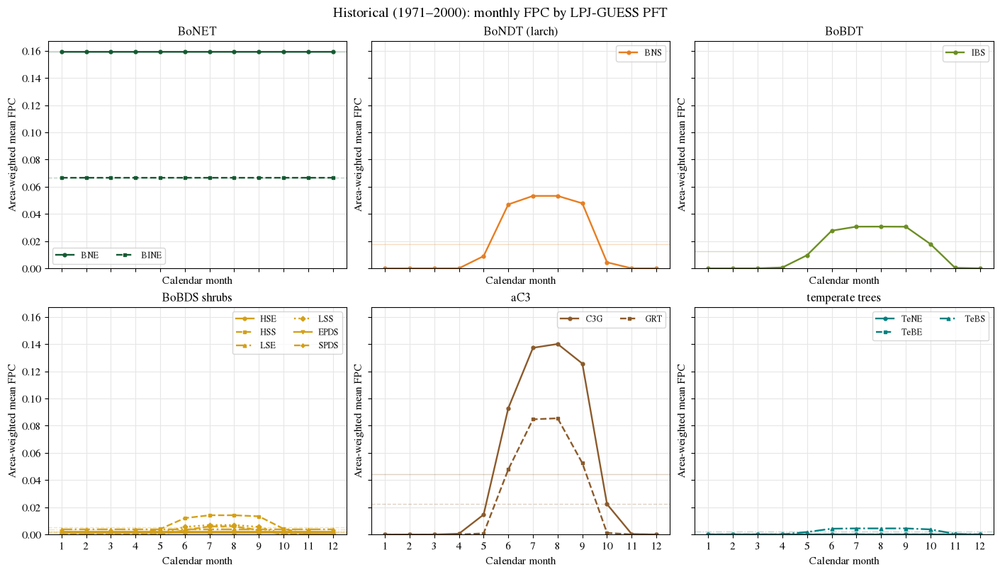

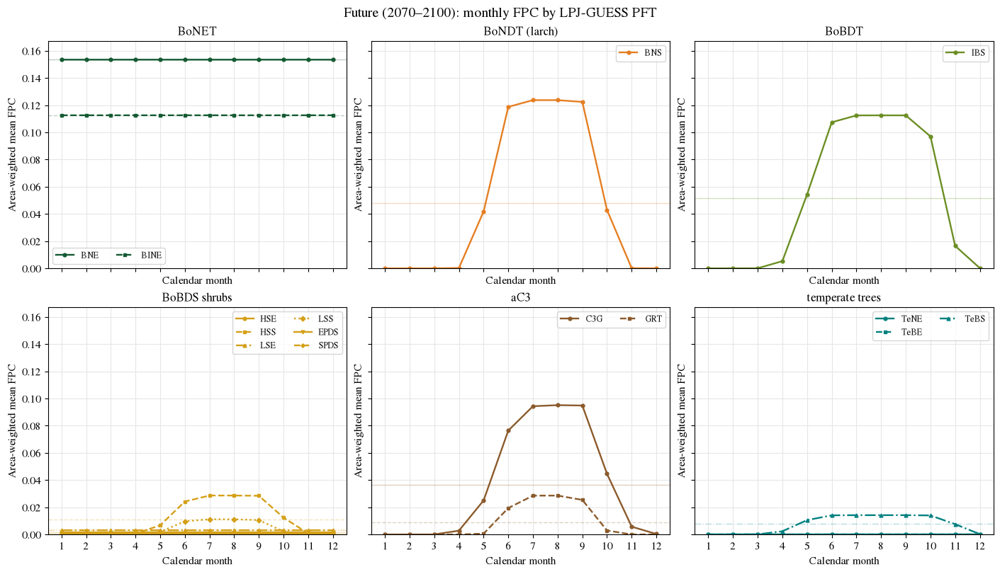

In [5]:
def members_by_group():
    return {
        group: [pft for pft in LPJ_NATURAL if PFT_TO_CLM_GROUP[pft] == group]
        for group in GROUP_COLORS
    }


def pft_style(pft, members):
    index = members.index(pft)
    return PFT_LINESTYLES[index % len(PFT_LINESTYLES)], PFT_MARKERS[index % len(PFT_MARKERS)]


def plot_seasonal_cycles(period):
    groups = members_by_group()
    seasonal = weighted_mean(data[period]["fpc"])
    ymax = 1.05 * max(float(weighted_mean(data[p]["fpc"]).max()) for p in data)
    fig, axes = plt.subplots(
        2, 3, figsize=(14, 8), sharex=True, sharey=True, layout="constrained"
    )
    axes = axes.ravel()

    for ax, (group, members) in zip(axes, groups.items()):
        color = GROUP_COLORS[group]
        for pft in members:
            line_style, marker = pft_style(pft, members)
            cycle = seasonal.sel(pft=pft)
            ax.plot(cycle.month, cycle, color=color, linestyle=line_style, marker=marker,
                    markersize=3.5, linewidth=1.7, label=pft)
            ax.axhline(float(cycle.mean("month")), color=color, linestyle=line_style,
                       linewidth=1.0, alpha=0.28)
        ax.set(title=group, xticks=range(1, 13), xlabel="Calendar month",
               ylabel="Area-weighted mean FPC", ylim=(0, ymax))
        ax.grid(color="0.9")
        ax.set_axisbelow(True)
        ax.legend(ncol=2, fontsize=9)

    fig.suptitle(f"{period}: monthly FPC by LPJ-GUESS PFT", fontsize=14)
    save_figure(fig, f"{slug(period)}_fpc_seasonal_cycles")
    plt.show()


for period in data:
    plot_seasonal_cycles(period)

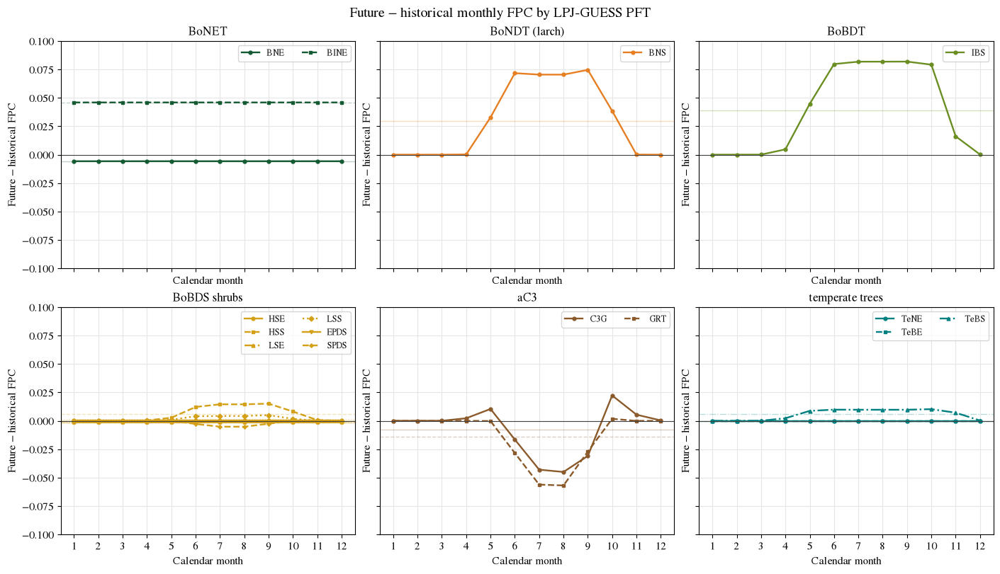

In [6]:
def plot_seasonal_cycle_changes():
    groups = members_by_group()

    historical = weighted_mean(data[historical_name]["fpc"])
    future = weighted_mean(data[future_name]["fpc"])
    change = future - historical

    ymax = 0.1 #1.05 * float(np.abs(change).max())

    fig, axes = plt.subplots(
        2, 3, figsize=(14, 8), sharex=True, sharey=True, layout="constrained"
    )
    axes = axes.ravel()

    for ax, (group, members) in zip(axes, groups.items()):
        color = GROUP_COLORS[group]

        for pft in members:
            line_style, marker = pft_style(pft, members)
            cycle_change = change.sel(pft=pft)

            ax.plot(
                cycle_change.month,
                cycle_change,
                color=color,
                linestyle=line_style,
                marker=marker,
                markersize=3.5,
                linewidth=1.7,
                label=pft,
            )

            # Future − historical annual-mean FPC
            ax.axhline(
                float(cycle_change.mean("month")),
                color=color,
                linestyle=line_style,
                linewidth=1,
                alpha=0.28,
            )

        ax.axhline(0, color="0.25", linewidth=0.8)
        ax.set(
            title=group,
            xticks=range(1, 13),
            xlabel="Calendar month",
            ylabel="Future − historical FPC",
            ylim=(-ymax, ymax),
        )
        ax.grid(color="0.9")
        ax.set_axisbelow(True)
        ax.legend(ncol=2, fontsize=9)

    fig.suptitle(
        "Future − historical monthly FPC by LPJ-GUESS PFT",
        fontsize=14,
    )
    save_figure(fig, "future_minus_historical_fpc_seasonal_cycles")
    plt.show()


plot_seasonal_cycle_changes()

## 5 · Annual, JJA and peak FPC comparison

Bar colour continues to identify the CLM target group. Hatching identifies
the temporal statistic, so the PFT-to-group colour mapping remains unchanged.


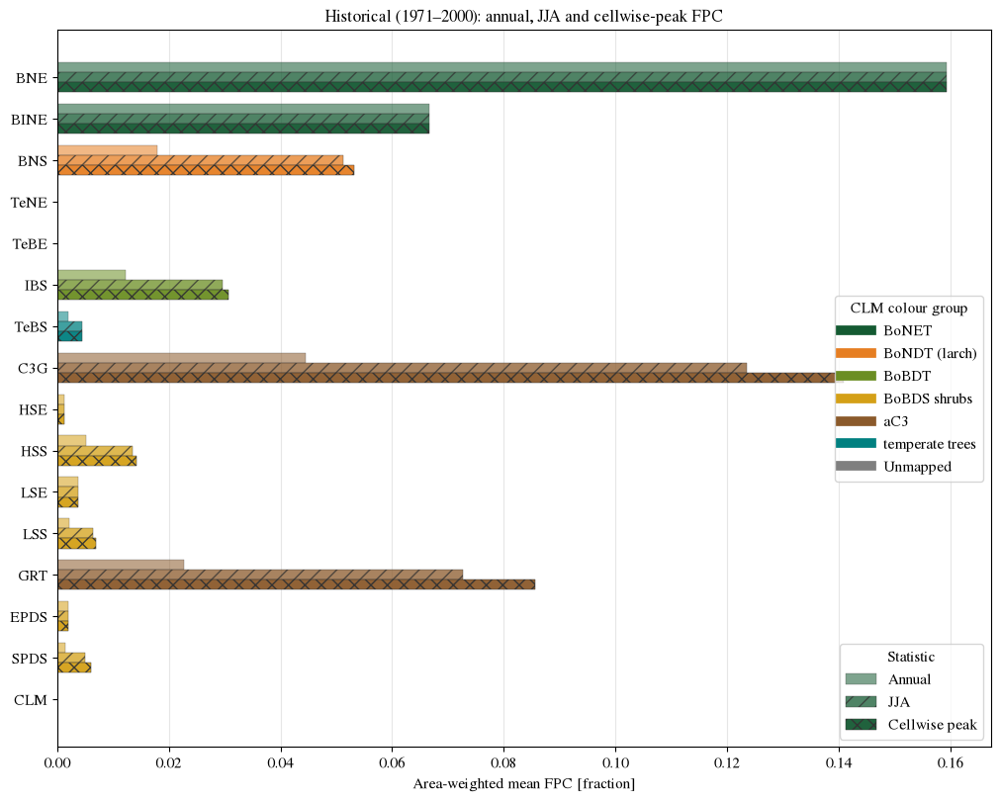

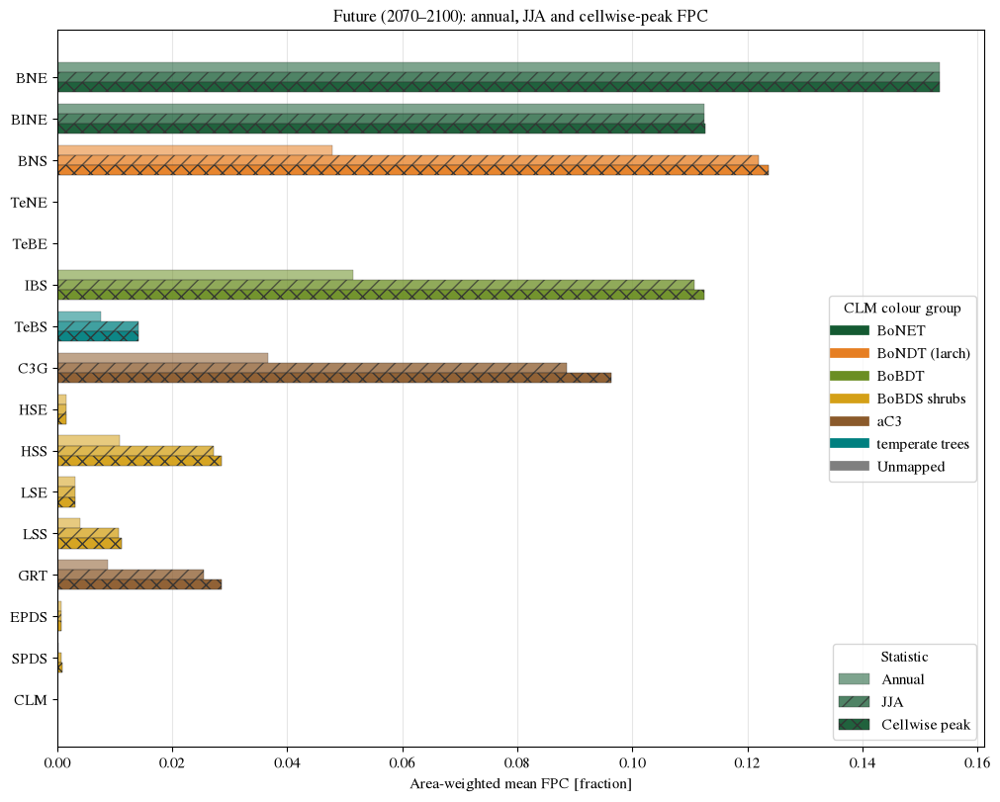

In [7]:
def plot_period_metric_comparison(period):
    table = summary.loc[summary.period == period].set_index("PFT").loc[LPJ_NATURAL]
    metrics = ["annual mean FPC", "JJA mean FPC", "peak FPC"]
    labels = ["Annual", "JJA", "Cellwise peak"]
    hatches = ["", "//", "xx"]
    y = np.arange(len(table))
    height = 0.24
    colors = [GROUP_COLORS[group] for group in table["CLM group"]]

    fig, ax = plt.subplots(figsize=(10, 8), layout="constrained")
    for index, (metric, label, hatch) in enumerate(zip(metrics, labels, hatches)):
        ax.barh(y + (index - 1) * height, table[metric], height=height, color=colors,
                alpha=0.55 + 0.2 * index, edgecolor="0.2", linewidth=0.35,
                hatch=hatch, label=label)
    ax.set(yticks=y, yticklabels=table.index, xlabel="Area-weighted mean FPC [fraction]",
           title=f"{period}: annual, JJA and cellwise-peak FPC")
    ax.invert_yaxis()
    ax.grid(axis="x", color="0.9")
    ax.set_axisbelow(True)
    metric_legend = ax.legend(title="Statistic", loc="lower right")
    group_handles = [Line2D([0], [0], color=color, lw=7, label=group)
                     for group, color in GROUP_COLORS.items()]
    ax.add_artist(metric_legend)
    ax.legend(handles=group_handles, title="CLM colour group", loc="center right")
    save_figure(fig, f"{slug(period)}_annual_jja_peak_fpc")
    plt.show()


for period in data:
    plot_period_metric_comparison(period)

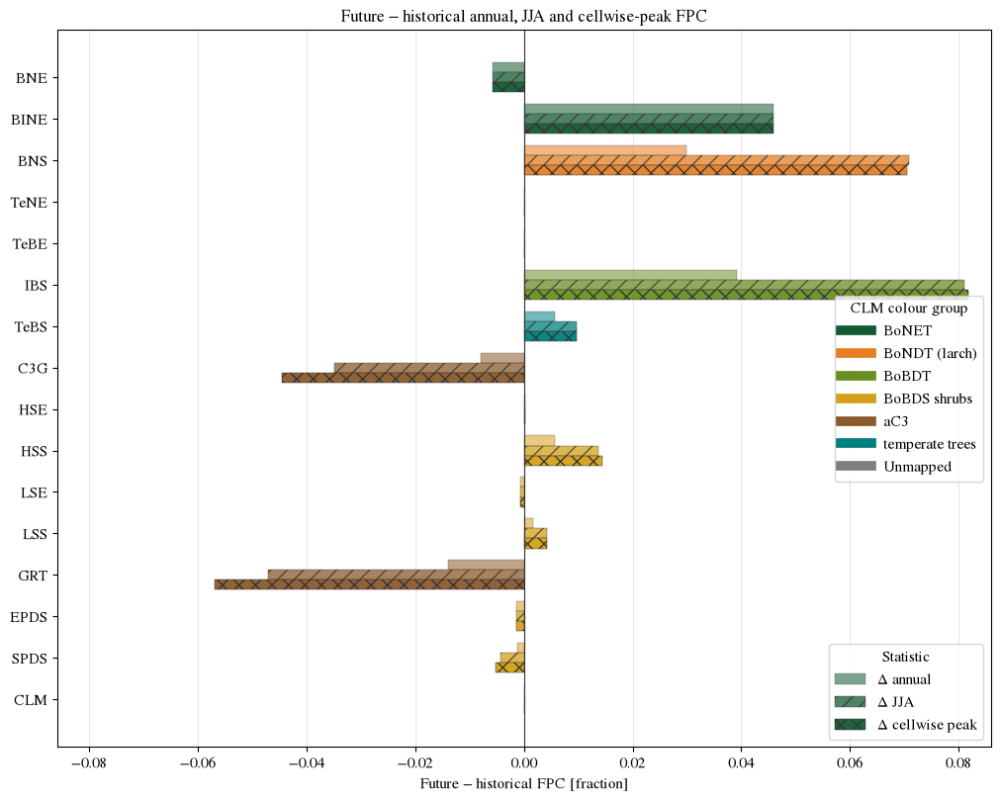

In [8]:
def plot_period_metric_changes():
    metrics = ["annual mean FPC", "JJA mean FPC", "peak FPC"]
    labels = ["Δ annual", "Δ JJA", "Δ cellwise peak"]
    hatches = ["", "//", "xx"]

    historical = (
        summary.loc[summary.period == historical_name]
        .set_index("PFT")
        .loc[LPJ_NATURAL]
    )
    future = (
        summary.loc[summary.period == future_name]
        .set_index("PFT")
        .loc[LPJ_NATURAL]
    )

    change = future[metrics] - historical[metrics]
    colors = [GROUP_COLORS[group] for group in future["CLM group"]]

    y = np.arange(len(change))
    height = 0.24
    xmax = 1.05 * float(np.abs(change).max().max())

    fig, ax = plt.subplots(figsize=(10, 8), layout="constrained")

    for index, (metric, label, hatch) in enumerate(
        zip(metrics, labels, hatches)
    ):
        ax.barh(
            y + (index - 1) * height,
            change[metric],
            height=height,
            color=colors,
            alpha=0.55 + 0.2 * index,
            edgecolor="0.2",
            linewidth=0.35,
            hatch=hatch,
            label=label,
        )

    ax.axvline(0, color="0.2", linewidth=0.8)
    ax.set(
        yticks=y,
        yticklabels=change.index,
        xlabel="Future − historical FPC [fraction]",
        title="Future − historical annual, JJA and cellwise-peak FPC",
        xlim=(-xmax, xmax),
    )
    ax.invert_yaxis()
    ax.grid(axis="x", color="0.9")
    ax.set_axisbelow(True)

    metric_legend = ax.legend(title="Statistic", loc="lower right")
    group_handles = [
        Line2D([0], [0], color=color, lw=7, label=group)
        for group, color in GROUP_COLORS.items()
    ]
    ax.add_artist(metric_legend)
    ax.legend(
        handles=group_handles,
        title="CLM colour group",
        loc="center right",
    )

    save_figure(fig, "future_minus_historical_annual_jja_peak_fpc")
    plt.show()


plot_period_metric_changes()

# ✨ This is an amazing plot. ✨
It contains lots of information:
- JJA mean is quite representative of most PFTs except for grass-like ones.
- the deciduous PFTs are underestimated by the annual mean
- overall we see which PFTs increase and which decrease (e.g. grass)


## 6 · Arctic FPC maps for every LPJ-GUESS PFT and period

Each three-panel figure shows annual-mean FPC, cellwise peak FPC, and the local
peak-minus-annual difference normalized by the **domain-wide area-weighted
annual mean** of that PFT:

$$
100\,\frac{FPC_{\mathrm{peak}}(x)-FPC_{\mathrm{annual}}(x)}
{\overline{FPC}_{\mathrm{annual}}}.
$$

Annual and peak maps share the same colour scale within each PFT and period.
The normalized panel uses a common scale across all PFTs and both periods.

Common normalized-correction scale: 0–3990.0% (99.5th percentile)


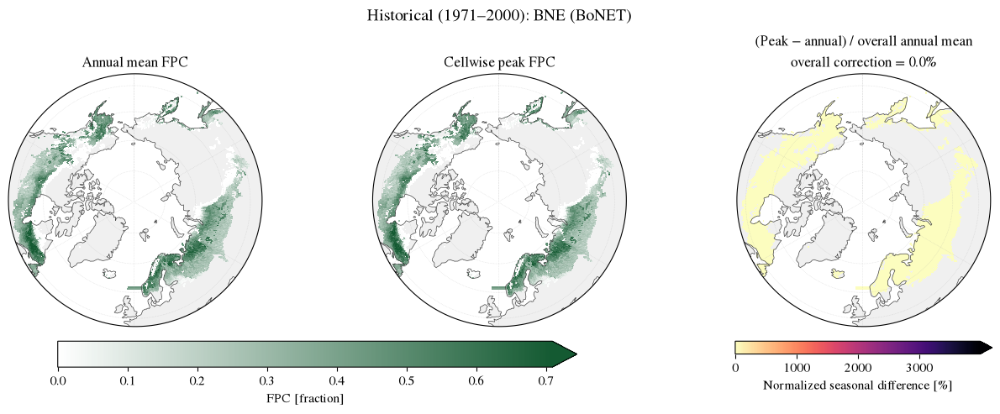

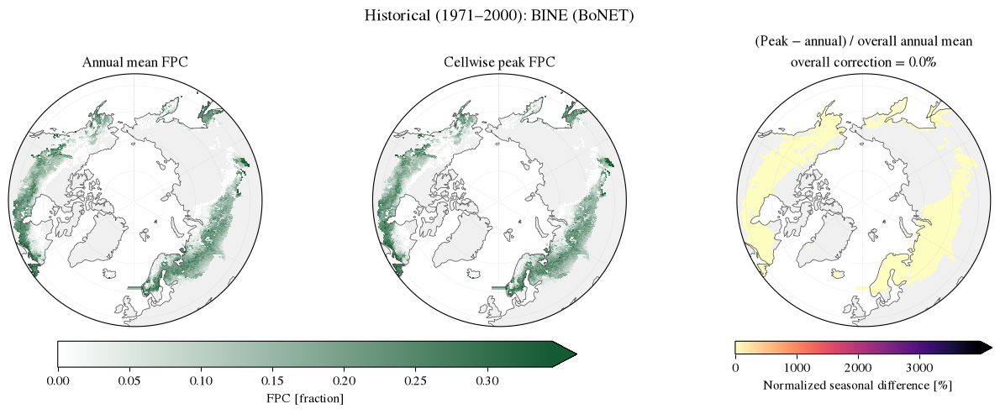

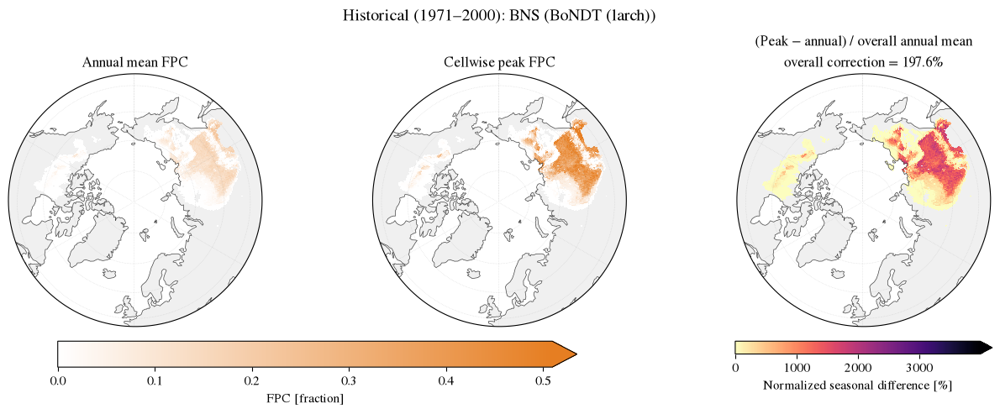

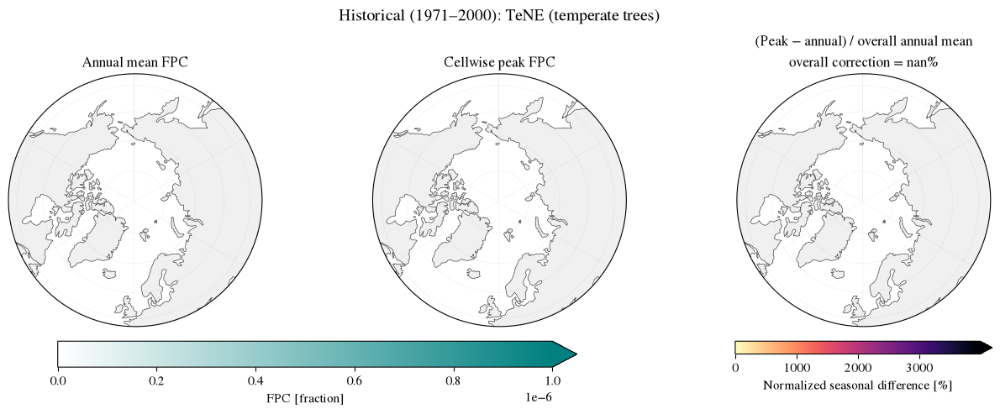

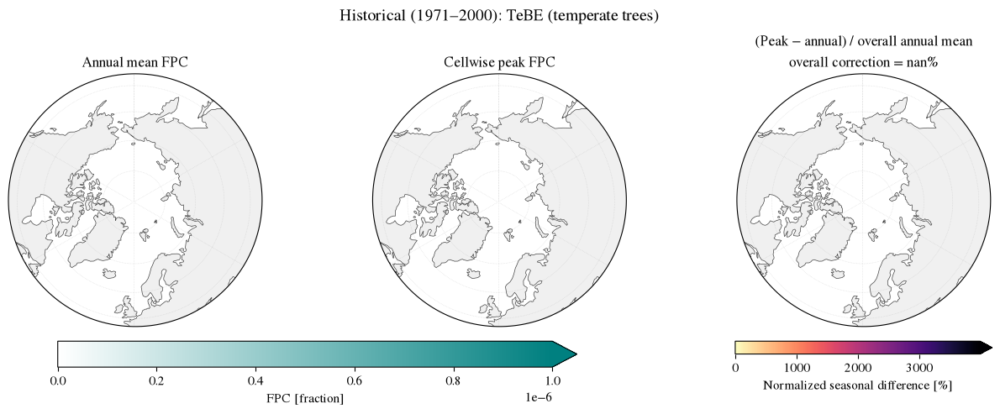

...

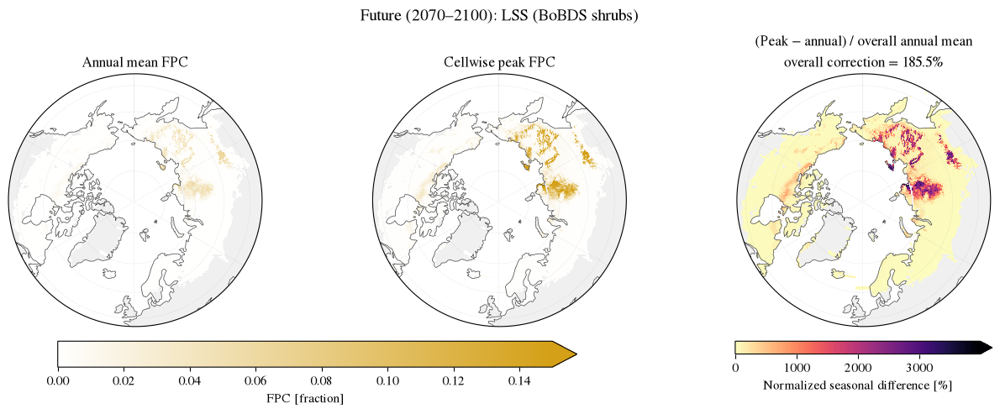

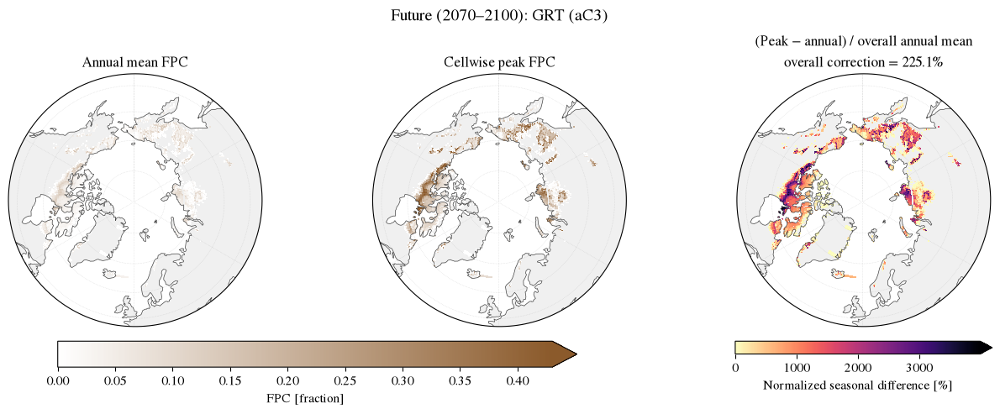

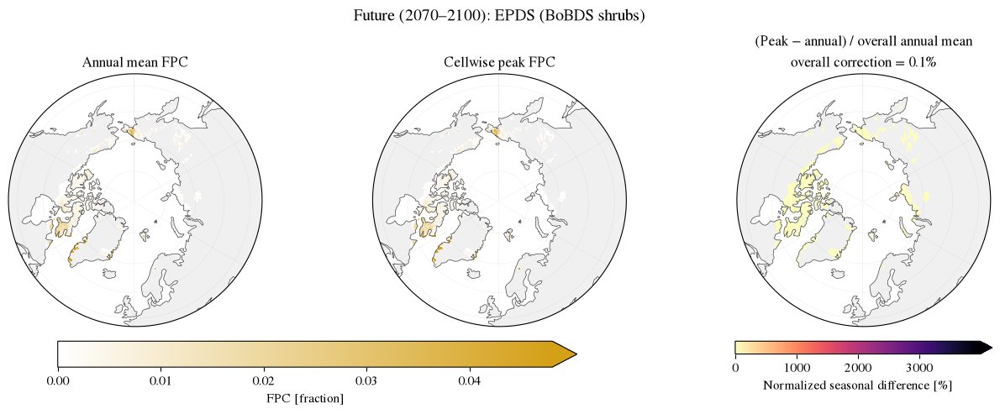

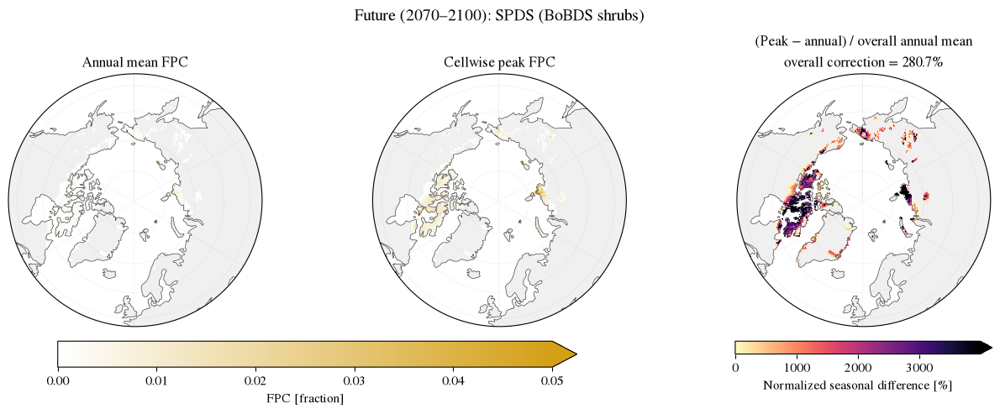

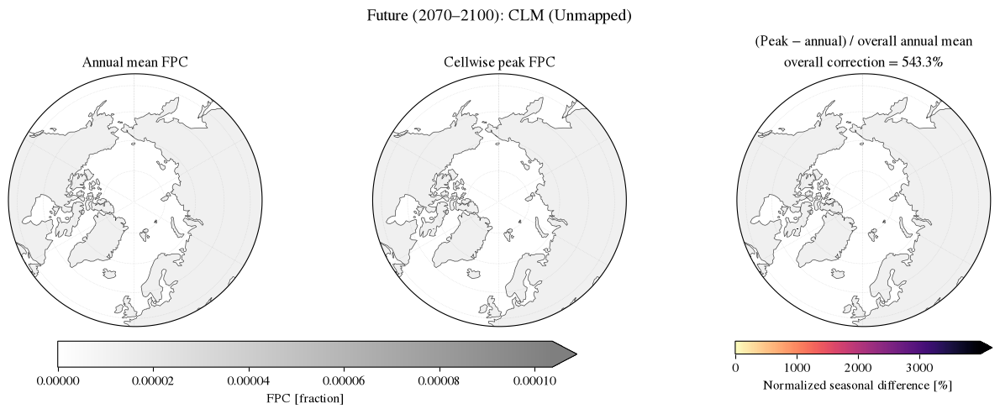

In [9]:
def robust_upper(fields, percentile=SCALE_PERCENTILE):
    arrays = [field.values[np.isfinite(field.values)] for field in fields
              if np.isfinite(field.values).any()]
    if not arrays:
        return 1e-6
    return max(float(np.percentile(np.concatenate(arrays), percentile)), 1e-6)


def configure_arctic_axis(ax):
    ax.set_extent(MAP_EXTENT, crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor="0.94", zorder=0)
    ax.add_feature(cfeature.OCEAN, facecolor="white", zorder=0)
    ax.coastlines(linewidth=0.5, color="0.25")
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.4, color="0.65",
                 alpha=0.5, linestyle=":")
    theta = np.linspace(0, 2 * np.pi, 200)
    circle = np.column_stack([np.sin(theta), np.cos(theta)]) * 0.5 + 0.5
    ax.set_boundary(mpath.Path(circle), transform=ax.transAxes)


map_cache = {}
all_normalized_values = []
for period in data:
    derived = data[period]["derived"]
    map_cache[period] = {}
    for pft in PFTS_TO_MAP:
        annual_raw = derived.annual_mean_fpc.sel(pft=pft)
        peak_raw = derived.peak_fpc.sel(pft=pft)
        active = np.isfinite(annual_raw) & np.isfinite(peak_raw) & (peak_raw > PRESENCE_THRESHOLD)
        overall_annual = float(weighted_mean(annual_raw))
        normalized = (
            (100 * (peak_raw - annual_raw) / overall_annual).where(active)
            if overall_annual > 0 else xr.full_like(annual_raw, np.nan)
        )
        overall_peak = float(weighted_mean(peak_raw))
        map_cache[period][pft] = {
            "annual": annual_raw.where(active),
            "peak": peak_raw.where(active),
            "normalized": normalized,
            "overall correction": (100 * (overall_peak - overall_annual) / overall_annual
                                   if overall_annual > 0 else np.nan),
        }
        values = normalized.values
        all_normalized_values.append(values[np.isfinite(values)])

nonempty_normalized = [values for values in all_normalized_values if values.size]
NORMALIZED_VMAX = max(
    float(np.percentile(np.concatenate(nonempty_normalized), SCALE_PERCENTILE)), 1e-6
) if nonempty_normalized else 1e-6
print(f"Common normalized-correction scale: 0–{NORMALIZED_VMAX:.1f}% ({SCALE_PERCENTILE}th percentile)")


def plot_pft_maps(period, pft):
    fields = map_cache[period][pft]
    group = PFT_TO_CLM_GROUP[pft]
    color = GROUP_COLORS[group]
    pft_cmap = LinearSegmentedColormap.from_list(f"{pft}_fpc", ["#FFFFFF", color])
    absolute_norm = Normalize(0, robust_upper([fields["annual"], fields["peak"]]))
    normalized_norm = Normalize(0, NORMALIZED_VMAX)
    projection = ccrs.Orthographic(central_longitude=0, central_latitude=90)
    fig, axes = plt.subplots(1, 3, figsize=(13, 4.8), subplot_kw={"projection": projection},
                             layout="constrained")
    plot_specs = [
        (fields["annual"], "Annual mean FPC", pft_cmap, absolute_norm),
        (fields["peak"], "Cellwise peak FPC", pft_cmap, absolute_norm),
        (fields["normalized"], "(Peak − annual) / overall annual mean\n"
                               f"overall correction = {fields['overall correction']:.1f}%",
         "magma_r", normalized_norm),
    ]
    images = []
    for ax, (field, title, cmap, norm) in zip(axes, plot_specs):
        configure_arctic_axis(ax)
        image = ax.pcolormesh(field.lon, field.lat, field, transform=ccrs.PlateCarree(),
                              shading="auto", cmap=cmap, norm=norm, rasterized=True)
        ax.set_title(title)
        images.append(image)

    absolute_bar = fig.colorbar(images[0], ax=axes[:2], orientation="horizontal",
                                shrink=0.72, pad=0.05, extend="max")
    absolute_bar.set_label("FPC [fraction]")
    normalized_bar = fig.colorbar(images[2], ax=axes[2], orientation="horizontal",
                                  shrink=0.72, pad=0.05, extend="max")
    normalized_bar.set_label("Normalized seasonal difference [%]")
    fig.suptitle(f"{period}: {pft} ({group})", fontsize=14)
    save_figure(fig, f"{slug(period)}_{pft.lower()}_fpc_maps")
    plt.show()


for period in data:
    for pft in PFTS_TO_MAP:
        plot_pft_maps(period, pft)

## 7 · Future minus historical FPC maps

For every LPJ-GUESS PFT, the panels show:

1. $\Delta FPC_{\mathrm{annual}}$;
2. $\Delta FPC_{\mathrm{peak}}$;
3. $\Delta(FPC_{\mathrm{peak}}-FPC_{\mathrm{annual}})$.

The third field isolates the change in the seasonal peak correction. All three
panels share one symmetric colour scale, so the relationship
$\Delta FPC_{\mathrm{peak}}=\Delta FPC_{\mathrm{annual}}+
\Delta(FPC_{\mathrm{peak}}-FPC_{\mathrm{annual}})$ is directly comparable.

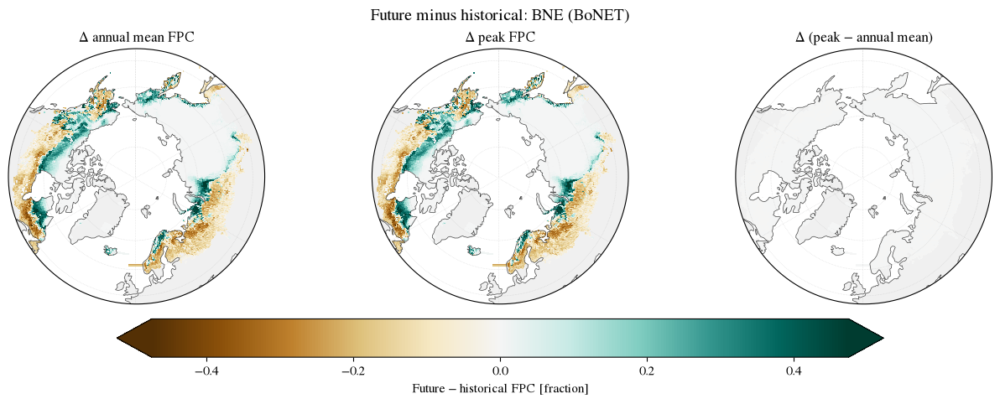

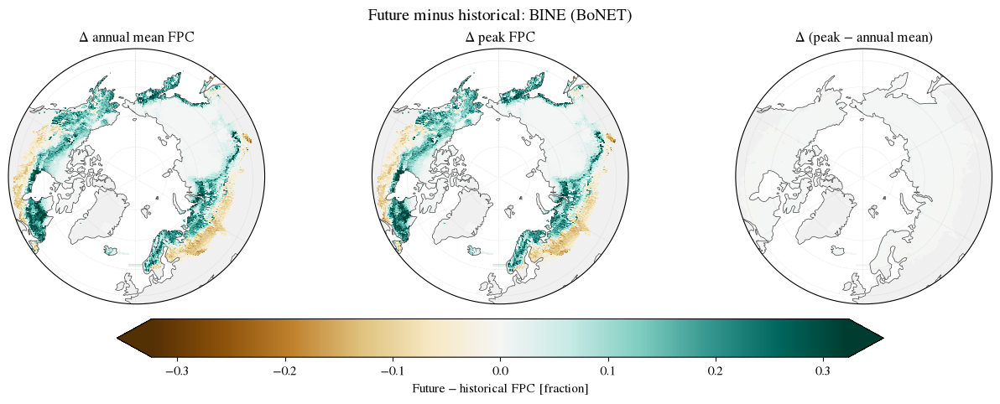

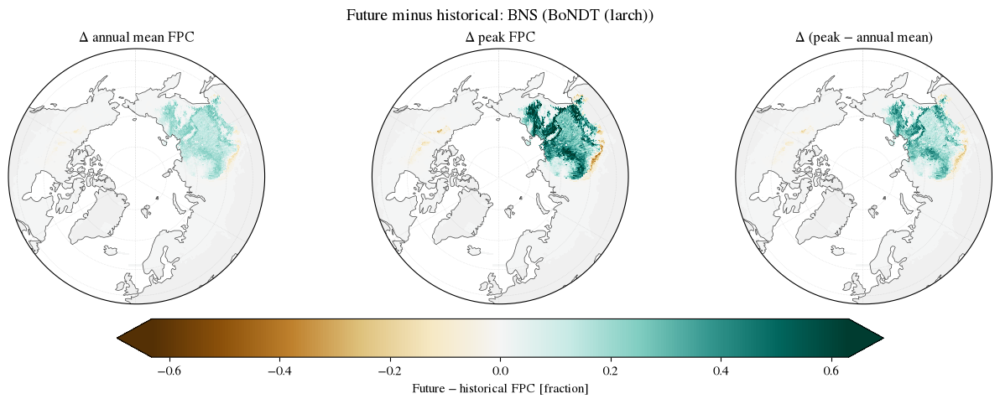

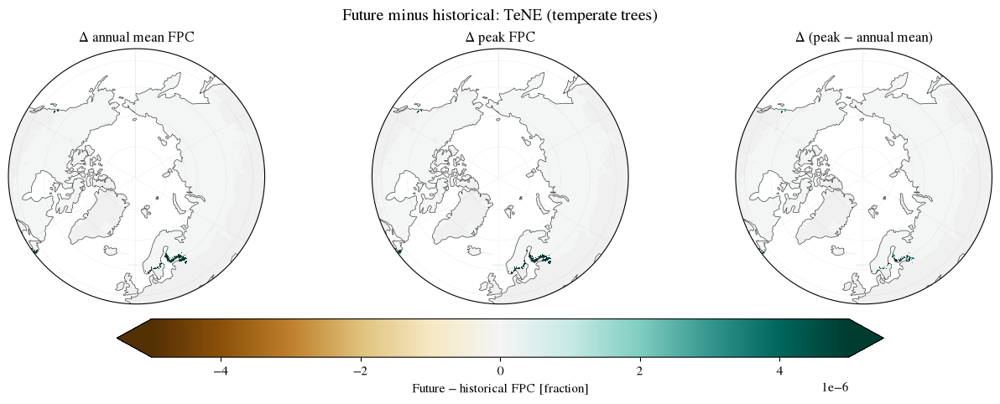

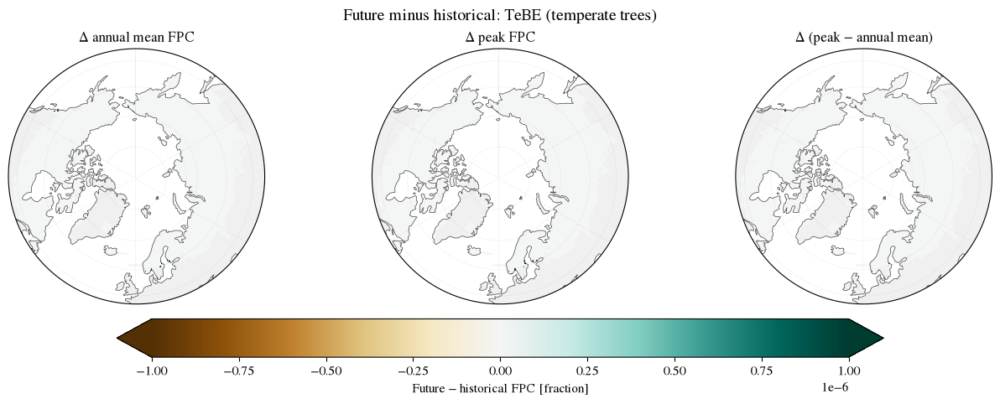

...

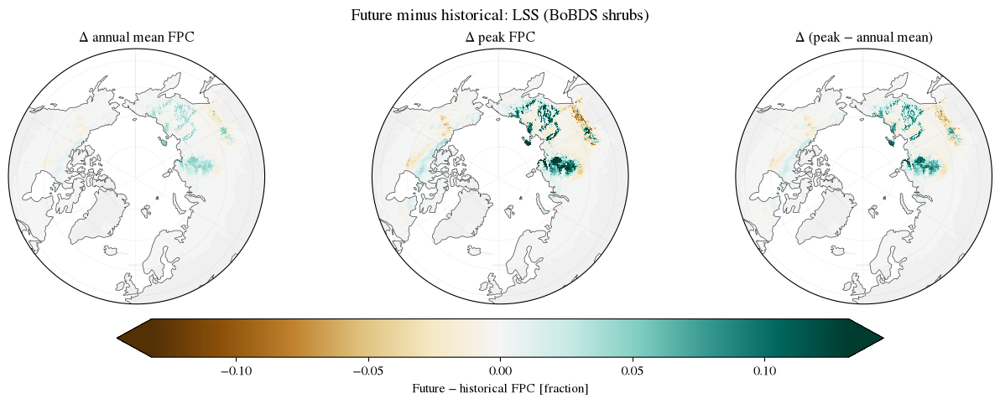

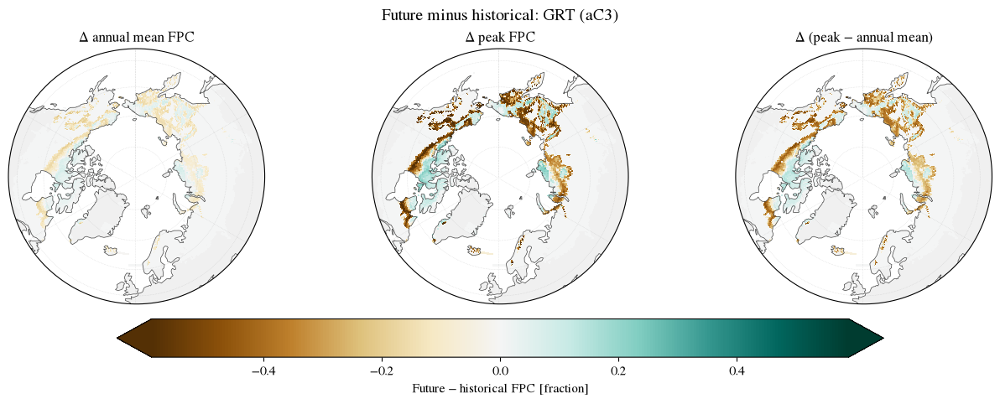

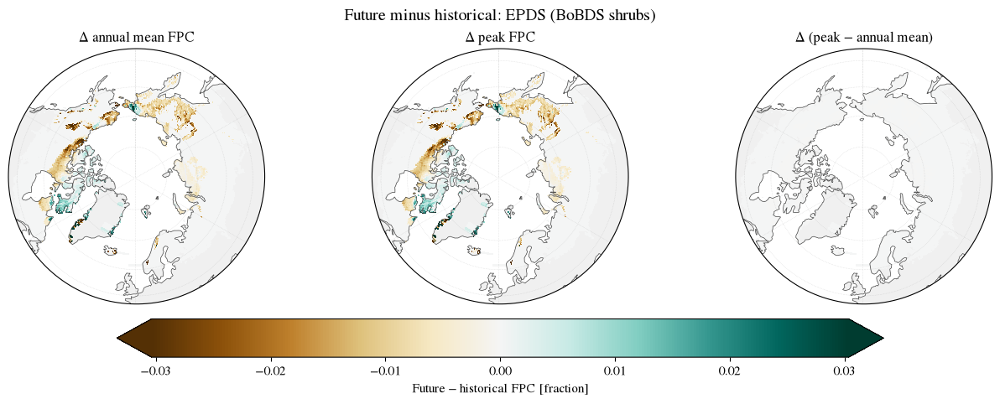

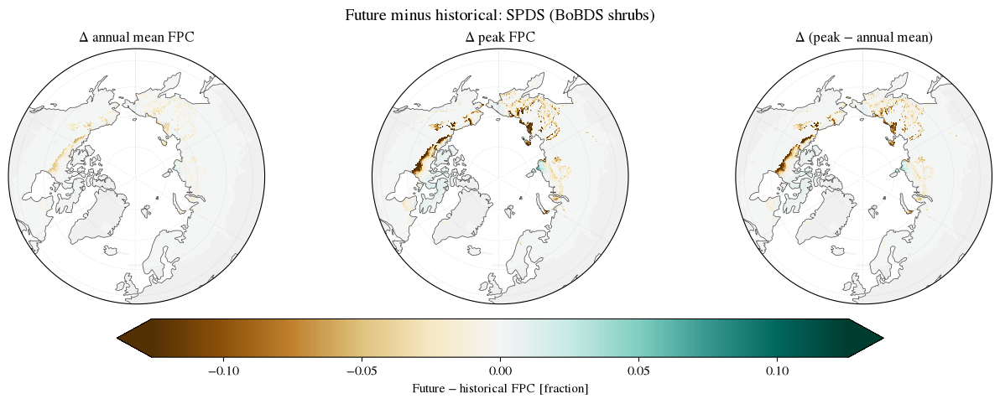

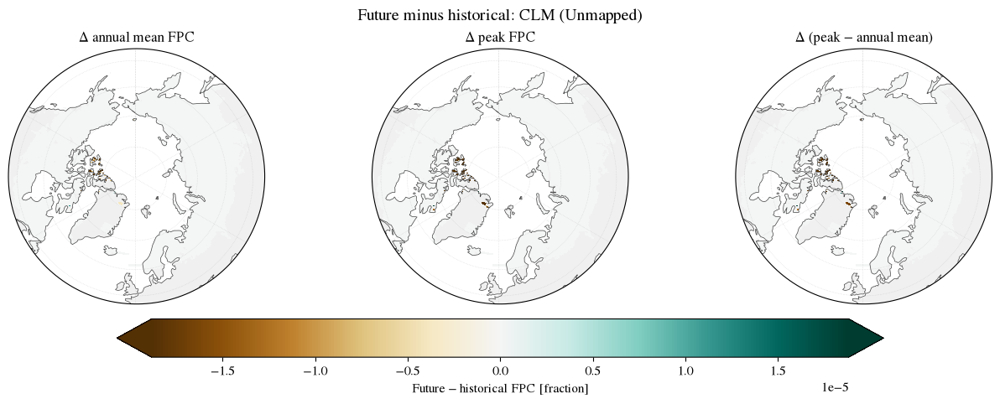

In [10]:
def plot_period_change_maps(pft):
    historical = data[historical_name]["derived"].sel(pft=pft)
    future = data[future_name]["derived"].sel(pft=pft)
    historical_seasonal = historical.peak_fpc - historical.annual_mean_fpc
    future_seasonal = future.peak_fpc - future.annual_mean_fpc
    changes = [
        future.annual_mean_fpc - historical.annual_mean_fpc,
        future.peak_fpc - historical.peak_fpc,
        future_seasonal - historical_seasonal,
    ]
    titles = [
        "Δ annual mean FPC",
        "Δ peak FPC",
        "Δ (peak − annual mean)",
    ]
    arrays = [field.values[np.isfinite(field.values)] for field in changes
              if np.isfinite(field.values).any()]
    values = np.concatenate(arrays) if arrays else np.array([0.0])
    vmax = max(float(np.percentile(np.abs(values), SCALE_PERCENTILE)), 1e-6)
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0, vmax=vmax)
    projection = ccrs.Orthographic(central_longitude=0, central_latitude=90)
    fig, axes = plt.subplots(1, 3, figsize=(13, 4.7), subplot_kw={"projection": projection},
                             layout="constrained")
    image = None
    for ax, field, title in zip(axes, changes, titles):
        configure_arctic_axis(ax)
        image = ax.pcolormesh(field.lon, field.lat, field, transform=ccrs.PlateCarree(),
                              shading="auto", cmap="BrBG", norm=norm, rasterized=True)
        ax.set_title(title)
    colorbar = fig.colorbar(image, ax=axes, orientation="horizontal", shrink=0.72,
                            pad=0.05, extend="both")
    colorbar.set_label("Future − historical FPC [fraction]")
    fig.suptitle(f"Future minus historical: {pft} ({PFT_TO_CLM_GROUP[pft]})", fontsize=14)
    save_figure(fig, f"future_minus_historical_{pft.lower()}_fpc_maps")
    plt.show()


for pft in PFTS_TO_MAP:
    plot_period_change_maps(pft)

## 8 · FPC–LAI relationship at the FPC peak

LAI is loaded for the first time here. It is sampled from the same PFT, grid
cell and month as peak FPC. These are descriptive paired diagnostics, not a
conversion model.

,,file,rows,grid cells,months,repeated headers removed,duplicate keys,incomplete cells,missing numeric values,lon range,lat range,Total − ΣPFT mean |residual|,Total − ΣPFT max |residual|
period,variable,,,,,,,,,,,,
Historical (1971–2000),LAI,mlai_pft_avg_1971_2000_monthly_mean.out,200568,16714,1–12,0,0,0,0,-179.75 to 179.75,45.75 to 83.25,0.340991,3.247252
Future (2070–2100),LAI,mlai_pft_avg_2070_2100_monthly_mean.out,199428,16619,1–12,1,0,0,0,-179.75 to 179.75,45.75 to 83.25,0.501226,4.228732


FPC and LAI coordinates match exactly within both periods.


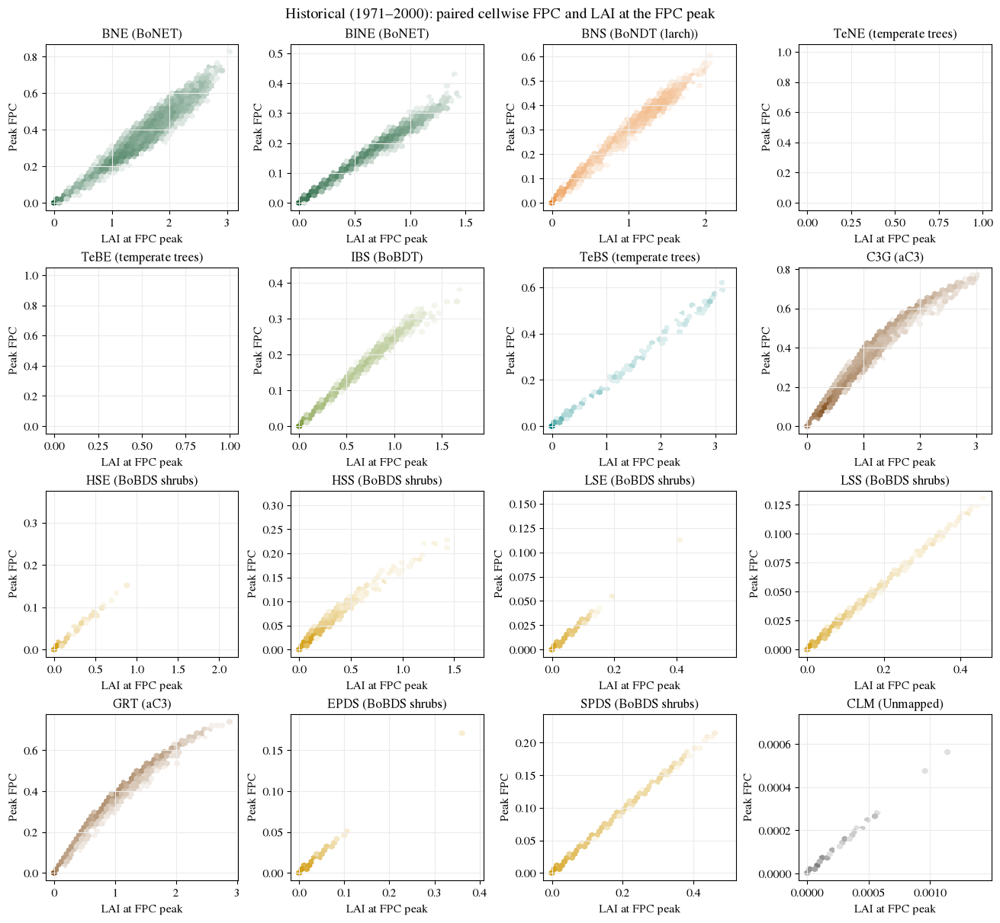

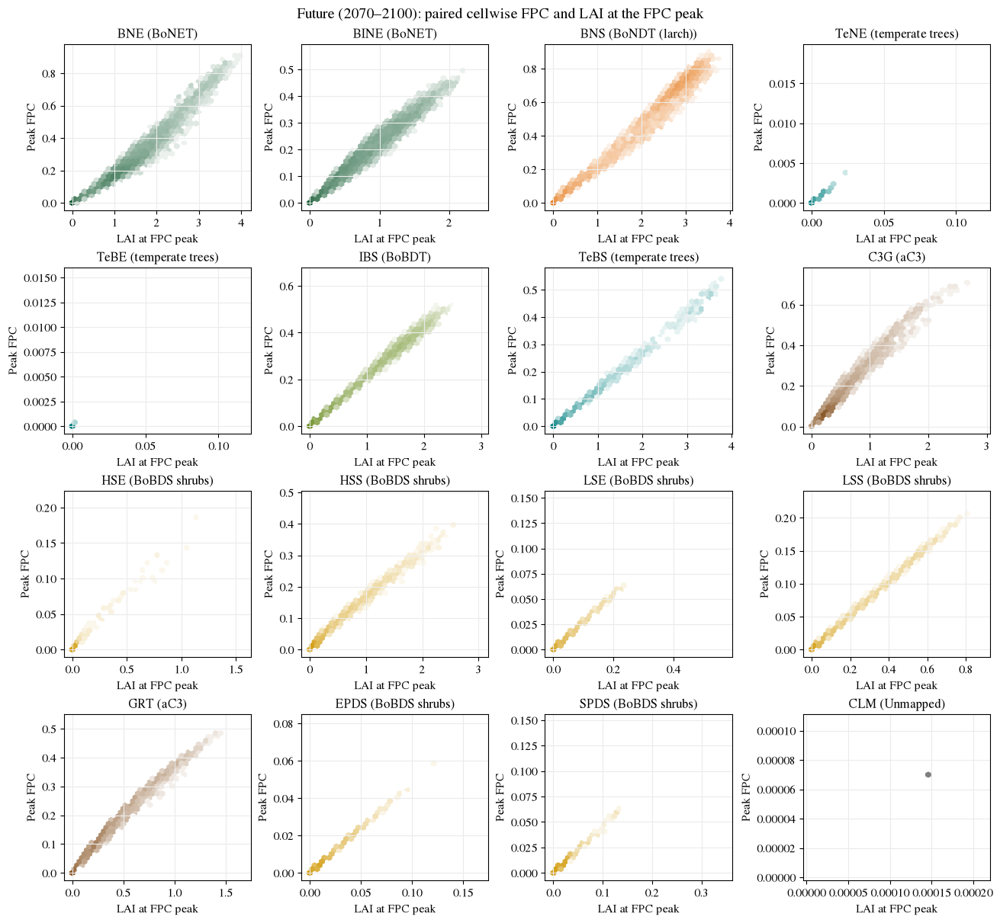

Created 112 figure files in /cluster/home/adelez/BOREAL-FOREST-EXPANSION/preprocess/edit-surfdatafile/fpc-to-pft-processing/monthly-lpjguess-fpc-exploration-figures/LPJGUESS-PFTs


In [11]:
LAI_FILES = {
    "Historical (1971–2000)": DATA_DIR / "mlai_pft_avg_1971_2000_monthly_mean.out",
    "Future (2070–2100)": DATA_DIR / "mlai_pft_avg_2070_2100_monthly_mean.out",
}

lai_data = {}
lai_reports = []
for period, path in LAI_FILES.items():
    lai, _, report = load_monthly_field(path)
    _, lai = xr.align(data[period]["fpc"], lai, join="exact")
    lai_data[period] = lai
    lai_reports.append({"period": period, "variable": "LAI", **report})

display(pd.DataFrame(lai_reports).set_index(["period", "variable"]))
print("FPC and LAI coordinates match exactly within both periods.")


def lai_at_fpc_peak(fpc, lai):
    peak_index = fpc.fillna(-np.inf).argmax("month")
    valid = np.isfinite(fpc).any("month") & np.isfinite(lai).any("month")
    return lai.isel(month=peak_index).reset_coords("month", drop=True).where(valid)


def plot_fpc_lai_peak(period):
    peak_fpc = data[period]["derived"].peak_fpc
    peak_lai = lai_at_fpc_peak(data[period]["fpc"], lai_data[period])
    fig, axes = plt.subplots(4, 4, figsize=(13, 12), layout="constrained")
    for ax, pft in zip(axes.ravel(), LPJ_NATURAL):
        fpc = peak_fpc.sel(pft=pft).values.ravel()
        lai = peak_lai.sel(pft=pft).values.ravel()
        valid = np.isfinite(fpc) & np.isfinite(lai) & (fpc > PRESENCE_THRESHOLD)
        if valid.sum() > 20000:
            rng = np.random.default_rng(42)
            sample = rng.choice(np.flatnonzero(valid), 20000, replace=False)
        else:
            sample = np.flatnonzero(valid)
        cmap = LinearSegmentedColormap.from_list(
            f"{pft}_density", ["white", GROUP_COLORS[PFT_TO_CLM_GROUP[pft]]]
        )
        ax.hexbin(lai[sample], fpc[sample], gridsize=35, mincnt=1, bins="log", cmap=cmap)
        ax.set(title=f"{pft} ({PFT_TO_CLM_GROUP[pft]})", xlabel="LAI at FPC peak",
               ylabel="Peak FPC")
        ax.grid(color="0.92")
    fig.suptitle(f"{period}: paired cellwise FPC and LAI at the FPC peak", fontsize=14)
    save_figure(fig, f"{slug(period)}_fpc_lai_at_peak")
    plt.show()


for period in data:
    plot_fpc_lai_peak(period)

created = sorted(path for path in FIGURE_DIR.iterdir() if path.suffix in {".png", ".pdf"})
print(f"Created {len(created)} figure files in {FIGURE_DIR.resolve()}")
#for path in created:
    #print(path.name)

# Conclusions